# Profiling main skforecast classes and methods

In [11]:
%load_ext autoreload
%autoreload 2
import sys
from pathlib import Path
sys.path.insert(1, str(Path.cwd().parent))
str(Path.cwd().parent)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


'/home/ubuntu/varios/skforecast'

In [18]:
import platform
import psutil
import skforecast
import pandas as pd
import numpy as np
import scipy
import sklearn
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMRegressor
from skforecast.recursive import ForecasterRecursiveMultiSeries
from skforecast.model_selection import grid_search_forecaster_multiseries
from skforecast.utils import align_series_and_exog_multiseries
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import make_column_transformer
from skforecast.preprocessing import series_long_to_dict
from skforecast.preprocessing import exog_long_to_dict
from skforecast.datasets import fetch_dataset

%load_ext pyinstrument
%load_ext line_profiler

The pyinstrument extension is already loaded. To reload it, use:
  %reload_ext pyinstrument
The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


# Information system and libraries

In [13]:
# Versions
# ==============================================================================
print(f"Python version: {platform.python_version()}")
print(f"scikit-learn version: {sklearn.__version__}")
print(f"skforecast version: {skforecast.__version__}")
print(f"pandas version: {pd.__version__}")
print(f"numpy version: {np.__version__}")
print(f"scipy version: {scipy.__version__}")
print(f"psutil version: {psutil.__version__}")
print("")

# Computer information
# ==============================================================================
print(f"Machine type: {platform.machine()}")
print(f"Processor type: {platform.processor()}")
print(f"Platform type: {platform.platform()}")
print(f"Operating system: {platform.system()}")
print(f"Operating system release: {platform.release()}")
print(f"Operating system version: {platform.version()}")
print(f"Number of physical cores: {psutil.cpu_count(logical=False)}")
print(f"Number of logical cores: {psutil.cpu_count(logical=True)}")

Python version: 3.12.5
scikit-learn version: 1.5.1
skforecast version: 0.14.0
pandas version: 2.2.3
numpy version: 1.26.4
scipy version: 1.14.1
psutil version: 5.9.0

Machine type: x86_64
Processor type: x86_64
Platform type: Linux-5.15.0-1072-aws-x86_64-with-glibc2.31
Operating system: Linux
Operating system release: 5.15.0-1072-aws
Operating system version: #78~20.04.1-Ubuntu SMP Wed Oct 9 15:30:47 UTC 2024
Number of physical cores: 16
Number of logical cores: 32


# ForecasterAutoregMultiSeries

In [14]:
# Data
# ==============================================================================
data = fetch_dataset(name='bdg2_daily')

infrequent_types = (
    data
    .drop_duplicates(subset=['building_id'])['primaryspaceusage']
    .value_counts()
    .loc[lambda x: x < 100]
    .index
    .tolist()
)
infrequent_subtypes = (
    data
    .drop_duplicates(subset=['building_id'])['sub_primaryspaceusage']
    .value_counts()
    .loc[lambda x: x < 50]
    .index
    .tolist()
)

data['primaryspaceusage'] = np.where(
    data['primaryspaceusage'].isin(infrequent_types),
    'Other',
    data['primaryspaceusage']
)
data['sub_primaryspaceusage'] = np.where(
    data['sub_primaryspaceusage'].isin(infrequent_subtypes),
    'Other',
    data['sub_primaryspaceusage']
)

# Calendar features
# ==============================================================================
data['day_of_week'] = data.index.dayofweek
data['week_of_year'] = data.index.isocalendar().week.astype(int)
data['month'] = data.index.month

# Cyclical encoding of calendar features
# ==============================================================================
data['sin_day_of_week'] = np.sin(2*np.pi*data['day_of_week']/7)
data['cos_day_of_week'] = np.cos(2*np.pi*data['day_of_week']/7)
data['sin_week_of_year'] = np.sin(2*np.pi*data['week_of_year']/52)
data['cos_week_of_year'] = np.cos(2*np.pi*data['week_of_year']/52)
data['sin_month'] = np.sin(2*np.pi*data['month']/12)
data['cos_month'] = np.cos(2*np.pi*data['month']/12)

# Transformer: ordinal encoding
# ==============================================================================
# A ColumnTransformer is used to transform categorical (not numerical) features
# using ordinal encoding. Numeric features are left untouched. Missing values
# are coded as -1. If a new category is found in the test set, it is encoded
# as -1.
categorical_features = ['primaryspaceusage', 'sub_primaryspaceusage', 'timezone']
transformer_exog = make_column_transformer(
                       (
                           OrdinalEncoder(
                               dtype=float,
                               handle_unknown="use_encoded_value",
                               unknown_value=np.nan,
                               encoded_missing_value=np.nan
                           ),
                           categorical_features
                       ),
                       remainder="passthrough",
                       verbose_feature_names_out=False,
                   ).set_output(transform="pandas")
transformer_exog

# Exogenous features selected for modeling
# ==============================================================================
exog_features = [
    "primaryspaceusage",
    "sub_primaryspaceusage",
    "timezone",
    "sqm",
    "airTemperature",
    "cloudCoverage",
    "dewTemperature",
    "precipDepth1HR",
    "precipDepth6HR",
    "seaLvlPressure",
    "windDirection",
    "windSpeed",
    "sin_day_of_week",
    "cos_day_of_week",
    "sin_week_of_year",
    "cos_week_of_year",
    "sin_month",
    "cos_month",
]

# Transform series and exog to dictionaries
# ==============================================================================
series_dict = series_long_to_dict(
    data      = data.reset_index(),
    series_id = 'building_id',
    index     = 'timestamp',
    values    = 'meter_reading',
    freq      = 'D'
)

exog_dict = exog_long_to_dict(
    data      = data[exog_features + ['building_id']].reset_index(),
    series_id = 'building_id',
    index     = 'timestamp',
    freq      = 'D'
)

data = data.sort_index()
end_train = '2017-08-31 23:59:00'
end_validation = '2017-10-31 23:59:00'
series_dict_train = {k: v.loc[: end_train,] for k, v in series_dict.items()}
series_dict_valid = {k: v.loc[end_train: end_validation,] for k, v in series_dict.items()}
series_dict_test = {k: v.loc[end_validation:,] for k, v in series_dict.items()}
exog_dict_train = {k: v.loc[: end_train,] for k, v in exog_dict.items()}
exog_dict_valid = {k: v.loc[end_train: end_validation,] for k, v in exog_dict.items()}
exog_dict_test = {k: v.loc[end_validation:,] for k, v in exog_dict.items()}

bdg2_daily
----------
Daily energy consumption data from the The Building Data Genome Project 2 with
building metadata and weather data. https://github.com/buds-lab/building-data-
genome-project-2
Miller, C., Kathirgamanathan, A., Picchetti, B. et al. The Building Data Genome
Project 2, energy meter data from the ASHRAE Great Energy Predictor III
competition. Sci Data 7, 368 (2020). https://doi.org/10.1038/s41597-020-00712-x
Shape of the dataset: (1153518, 17)


In [15]:
# Forecaster
# ==============================================================================
forecaster = ForecasterRecursiveMultiSeries(
    regressor=LGBMRegressor(random_state=8520, verbose=-1),
    lags=14,
    transformer_series=None,
    transformer_exog=transformer_exog,
    fit_kwargs={'categorical_feature': categorical_features},
    encoding="ordinal"
)

/home/ubuntu/anaconda3/envs/skforecast_14_py12/lib/python3.12/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py:1079: MissingValuesWarning: NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(


_     ._   __/__   _ _  _  _ _/_   Recorded: 22:42:13  Samples:  10746
 /_//_/// /_\ / //_// / //_'/ //     Duration: 18.955    CPU time: 73.952
/   _/                      v5.0.0

Cell [16]

18.954 <module>  /tmp/ipykernel_58083/2636560737.py:1
`- 18.952 ForecasterRecursiveMultiSeries.fit  skforecast/recursive/_forecaster_recursive_multiseries.py:1473
      [129 frames hidden]  skforecast, pandas, sklearn, joblib, ...
         3.877 Booster.update  lightgbm/basic.py:4063
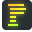

In [16]:
%%pyinstrument

forecaster.fit(series=series_dict_train, exog=exog_dict_train)

In [17]:
# Profiling fit()
# ==============================================================================
def funt_to_profile(forecaster, series, exog):
    forecaster.fit(series=series, exog=exog)

%lprun -f forecaster.fit funt_to_profile(forecaster, series_dict_train, exog_dict_train)

/home/ubuntu/anaconda3/envs/skforecast_14_py12/lib/python3.12/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py:1079: MissingValuesWarning: NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(


Timer unit: 1e-09 s

Total time: 29.5069 s
File: /home/ubuntu/anaconda3/envs/skforecast_14_py12/lib/python3.12/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py
Function: fit at line 1473

Line #      Hits         Time  Per Hit   % Time  Line Contents
  1473                                               def fit(
  1474                                                   self,
  1475                                                   series: Union[pd.DataFrame, dict],
  1476                                                   exog: Optional[Union[pd.Series, pd.DataFrame, dict]] = None,
  1477                                                   store_last_window: Union[bool, list] = True,
  1478                                                   store_in_sample_residuals: bool = True,
  1479                                                   suppress_warnings: bool = False
  1480                                               ) -> None:
  1481                                 

In [17]:
# Profiling _create_train_X_y()
# ==============================================================================
def funt_to_profile(forecaster, series, exog):
    forecaster._create_train_X_y(series=series, exog=exog)

%lprun -f forecaster._create_train_X_y funt_to_profile(forecaster, series_dict_train, exog_dict_train)

/home/ubuntu/varios/skforecast/skforecast/ForecasterAutoregMultiSeries/ForecasterAutoregMultiSeries.py:821: MissingValuesWarning: NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(


Timer unit: 1e-09 s

Total time: 8.20557 s
File: /home/ubuntu/varios/skforecast/skforecast/ForecasterAutoregMultiSeries/ForecasterAutoregMultiSeries.py
Function: _create_train_X_y at line 595

Line #      Hits         Time  Per Hit   % Time  Line Contents
   595                                               def _create_train_X_y(
   596                                                   self,
   597                                                   series: Union[pd.DataFrame, dict],
   598                                                   exog: Optional[Union[pd.Series, pd.DataFrame, dict]]=None,
   599                                                   store_last_window: Union[bool, list]=True,
   600                                               ) -> Tuple[pd.DataFrame, pd.Series, dict, list, list, list, dict, dict]:
   601                                                   """
   602                                                   Create training matrices from multiple time series an

In [22]:
# Profiling align_series_and_exog_multiseries()
# ==============================================================================
def funt_to_profile(series_dict, input_series_is_dict, exog_dict):
    align_series_and_exog_multiseries(
        series_dict=series_dict,
        input_series_is_dict=input_series_is_dict,
        exog_dict = exog_dict,
    )

%lprun -f align_series_and_exog_multiseries funt_to_profile(series_dict_train, True, exog_dict_train)

Timer unit: 1e-09 s

Total time: 3.08328 s
File: /home/ubuntu/anaconda3/envs/skforecast_14_py12/lib/python3.12/site-packages/skforecast/utils/utils.py
Function: align_series_and_exog_multiseries at line 2406

Line #      Hits         Time  Per Hit   % Time  Line Contents
  2406                                           def align_series_and_exog_multiseries(
  2407                                               series_dict: dict,
  2408                                               input_series_is_dict: bool,
  2409                                               exog_dict: dict = None
  2410                                           ) -> Tuple[Union[pd.Series, pd.DataFrame], Union[pd.Series, pd.DataFrame]]:
  2411                                               """
  2412                                               Align series and exog according to their index. If needed, reindexing is
  2413                                               applied. Heading and trailing NaNs are removed fro

In [23]:
# Profiling check_preprocess_exog_multiseries()
# ==============================================================================
series_indexes = {k: v.index for k, v  in series_dict_train.items()}
series_col_names = list(series_dict_train.keys())

def funt_to_profile(input_series_is_dict, series_indexes, series_col_names, exog, exog_dict):
    check_preprocess_exog_multiseries(
        input_series_is_dict = input_series_is_dict,
        series_indexes = series_indexes,
        series_col_names = series_col_names,
        exog = exog_dict_train,
        exog_dict = exog_dict_train,
    )

%lprun -f check_preprocess_exog_multiseries funt_to_profile(True, series_indexes, series_col_names, exog, exog_dict)

Timer unit: 1e-09 s

Total time: 0.911268 s
File: /home/ubuntu/varios/skforecast/skforecast/utils/utils.py
Function: check_preprocess_exog_multiseries at line 2361

Line #      Hits         Time  Per Hit   % Time  Line Contents
  2361                                           def check_preprocess_exog_multiseries(
  2362                                               input_series_is_dict: bool,
  2363                                               series_indexes: dict,
  2364                                               series_col_names: list,
  2365                                               exog: Union[pd.Series, pd.DataFrame, dict],
  2366                                               exog_dict: dict,
  2367                                           ) -> Tuple[dict, list]:
  2368                                               """
  2369                                               Check and preprocess `exog` argument in `ForecasterAutoregMultiSeries` and
  2370                    

In [ ]:
import pandas as pd
import numpy as np
import time

def fun_original():
    pass

def fun_optimized_1():
    pass

start_time = time.time()
try:
    fun_original()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Original code execution time: {end_time - start_time} seconds")

start_time = time.time()
try:
    fun_optimized_1()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Optimized code 1 execution time: {end_time - start_time} seconds")


Original code execution time: 9.608268737792969e-05 seconds
Optimized code 1 execution time: 7.390975952148438e-05 seconds
